<a href="https://colab.research.google.com/github/brunopdrocha/ml_ibmec/blob/main/AP2_MachineLeaning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Impacts of COVID-19 on Canadians - Mental Health 'Crowdsourcing: Impacts of COVID-19 on Canadians' Mental Health'

DOI: https://doi.org/10.25318/13250002-eng

*   ALUNO(A) 1: Bruno Pilão - 202201037911
*   ALUNO(A) 2: Ivo G Lavacek - 202203473107
*   ALUNO(A) 3: Pedro P Lustosa - 202203798936


  Este trabalho tem como objetivo aplicar técnicas de análise, preparação e modelagem dos dados para obter o melhor desempenho possível em ênfase ao nosso caso de estudo.

In [ ]:
# Vamos instalar a biblioteca do pycaret em nosso notebook
!pip install pycaret

## 1. Importação e Análise Inicial dos Dados

Esta etapa tem como objetivo abstrair os dados do nosso caso e realizar um estudo encima destes dados.

In [ ]:
# No inícios devemos importar as bibliotecas necessárias para a nossa análise
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### 1.1 Importação da Base de Dados

In [ ]:
# Importando a base
url = "https://github.com/alvaroriz/datascience_datasets/raw/refs/heads/main/iccmh2020rccsm_p.csv"
df = pd.read_csv(url)

### 1.2 Compreensão do Problema e Variáveis


In [ ]:
df.head()

,PUMFID,VERDATE,MH_05,MH_10,MH_15A,MH_15B,MH_15C,MH_15D,MH_15E,MH_15F,...,PCSIZMIZ,PIIDFLAG,PIMMST,PLM_30,PLM_40,PPROV,PRURURB,PVISMIN,PAGEGR,PUMFFACT
0,5106,10/06/2020,3,3,3,4,2,2,2,2,...,2,2,1,5,4,35,2,1,6,0.4165
1,5107,10/06/2020,3,3,3,1,2,2,1,2,...,3,2,1,4,4,13,2,2,7,0.7167
2,5108,10/06/2020,1,3,1,1,1,1,1,1,...,3,2,1,5,4,12,2,2,4,0.5585
3,5109,10/06/2020,2,4,3,3,2,3,2,3,...,2,2,1,5,3,48,2,2,4,1.9391
4,5110,10/06/2020,3,4,3,2,2,2,3,3,...,3,2,2,4,5,59,2,1,7,0.5311


In [ ]:
df.tail()

,PUMFID,VERDATE,MH_05,MH_10,MH_15A,MH_15B,MH_15C,MH_15D,MH_15E,MH_15F,...,PCSIZMIZ,PIIDFLAG,PIMMST,PLM_30,PLM_40,PPROV,PRURURB,PVISMIN,PAGEGR,PUMFFACT
45984,51090,10/06/2020,3,4,4,1,2,2,2,2,...,2,2,1,3,4,24,2,2,6,0.8225
45985,51091,10/06/2020,3,4,3,3,3,3,3,2,...,2,2,2,3,5,35,2,1,7,0.4688
45986,51092,10/06/2020,5,4,4,3,3,2,1,3,...,1,2,1,4,4,59,2,2,3,2.3538
45987,51093,10/06/2020,2,3,1,1,1,1,1,1,...,3,2,1,5,4,35,2,2,8,0.5386
45988,51094,10/06/2020,4,4,2,3,2,1,2,4,...,5,2,1,1,1,35,1,2,3,0.3827


Este aqui e o nosso datatable que vamos implementar nossa análise. E com isso vamos vizualizar os tipos de dados que possuímos em nosso datatable.


In [ ]:
# Vamos analizar os tipos de valores da nossa datatable
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45989 entries, 0 to 45988
Data columns (total 43 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   PUMFID    45989 non-null  int64  
 1   VERDATE   45989 non-null  object 
 2   MH_05     45989 non-null  int64  
 3   MH_10     45989 non-null  int64  
 4   MH_15A    45989 non-null  int64  
 5   MH_15B    45989 non-null  int64  
 6   MH_15C    45989 non-null  int64  
 7   MH_15D    45989 non-null  int64  
 8   MH_15E    45989 non-null  int64  
 9   MH_15F    45989 non-null  int64  
 10  MH_15G    45989 non-null  int64  
 11  MH_20     45989 non-null  int64  
 12  BH_60A    45989 non-null  int64  
 13  BH_60B    45989 non-null  int64  
 14  BH_60C    45989 non-null  int64  
 15  BH_55A    45989 non-null  int64  
 16  BH_55B    45989 non-null  int64  
 17  BH_55C    45989 non-null  int64  
 18  BH_55D    45989 non-null  int64  
 19  BH_55E    45989 non-null  int64  
 20  BH_55F    45989 non-null  in

A análise dos nossos dados revela que a maior parte deles está no formato Int64, de acordo com a documentação da base de dados. Isso ocorre porque a pesquisa foi baseada em um questionário aplicado a cada cidadão participante, no qual as respostas eram majoritariamente atribuídas em forma de notas, variando de 1 a 5, entre outros formatos similares. Dado esse contexto, podemos afirmar que os nossos dados são, em sua essência, **categóricos.**

### 1.3 Análise Exploratória dos Dados (AED)

In [ ]:
# Vamos vizualizar nossa datatable com os 5 valores iniciais e os 5 valores finais
df

,PUMFID,VERDATE,MH_05,MH_10,MH_15A,MH_15B,MH_15C,MH_15D,MH_15E,MH_15F,...,PCSIZMIZ,PIIDFLAG,PIMMST,PLM_30,PLM_40,PPROV,PRURURB,PVISMIN,PAGEGR,PUMFFACT
0,5106,10/06/2020,3,3,3,4,2,2,2,2,...,2,2,1,5,4,35,2,1,6,0.4165
1,5107,10/06/2020,3,3,3,1,2,2,1,2,...,3,2,1,4,4,13,2,2,7,0.7167
2,5108,10/06/2020,1,3,1,1,1,1,1,1,...,3,2,1,5,4,12,2,2,4,0.5585
3,5109,10/06/2020,2,4,3,3,2,3,2,3,...,2,2,1,5,3,48,2,2,4,1.9391
4,5110,10/06/2020,3,4,3,2,2,2,3,3,...,3,2,2,4,5,59,2,1,7,0.5311
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45984,51090,10/06/2020,3,4,4,1,2,2,2,2,...,2,2,1,3,4,24,2,2,6,0.8225
45985,51091,10/06/2020,3,4,3,3,3,3,3,2,...,2,2,2,3,5,35,2,1,7,0.4688
45986,51092,10/06/2020,5,4,4,3,3,2,1,3,...,1,2,1,4,4,59,2,2,3,2.3538
45987,51093,10/06/2020,2,3,1,1,1,1,1,1,...,3,2,1,5,4,35,2,2,8,0.5386


In [ ]:
# Agora vamos realizar uma análise estatisca emcima da nossa base de dados.
df.describe()

,PUMFID,MH_05,MH_10,MH_15A,MH_15B,MH_15C,MH_15D,MH_15E,MH_15F,MH_15G,...,PCSIZMIZ,PIIDFLAG,PIMMST,PLM_30,PLM_40,PPROV,PRURURB,PVISMIN,PAGEGR,PUMFFACT
count,45989.000000,45989.000000,45989.000000,45989.000000,45989.000000,45989.000000,45989.000000,45989.000000,45989.000000,45989.000000,...,45989.000000,45989.000000,45989.000000,45989.000000,45989.000000,45989.000000,45989.000000,45989.000000,45989.000000,45989.000000
mean,28100.000000,2.813912,3.569614,2.248712,1.918154,2.079606,2.169084,1.780578,2.237122,1.892866,...,2.572311,1.984692,1.139316,4.743199,3.297354,36.629672,1.973755,1.987149,5.509274,0.999999
std,13276.025102,1.059049,0.847054,1.035816,1.072094,1.078501,1.102288,1.057172,1.060339,1.053942,...,1.490925,0.366619,0.463563,4.869197,1.145658,13.376369,0.873778,0.805945,2.672188,0.926267
min,5106.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,10.000000,1.000000,1.000000,1.000000,0.087800
25%,16603.000000,2.000000,3.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,2.000000,1.000000,4.000000,3.000000,35.000000,2.000000,2.000000,3.000000,0.409600
50%,28100.000000,3.000000,4.000000,2.000000,2.000000,2.000000,2.000000,1.000000,2.000000,2.000000,...,2.000000,2.000000,1.000000,5.000000,4.000000,35.000000,2.000000,2.000000,5.000000,0.608100
75%,39597.000000,4.000000,4.000000,3.000000,2.000000,3.000000,3.000000,2.000000,3.000000,2.000000,...,3.000000,2.000000,1.000000,6.000000,4.000000,47.000000,2.000000,2.000000,8.000000,1.186000
max,51094.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,...,9.000000,9.000000,9.000000,99.000000,9.000000,63.000000,9.000000,9.000000,10.000000,6.267000


Vamos exportar uma relatório de Análise Exploratório para vizualizar correlações, valores nulos,

In [ ]:
!pip install ydata-profiling

In [ ]:
from ydata_profiling import ProfileReport

# Criar o relatório
profile = ProfileReport(df, title="Relatório de Análise Exploratória", explorative=True)

# Exibir no navegador
profile.to_notebook_iframe()  # Se estiver em um notebook Jupyter


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

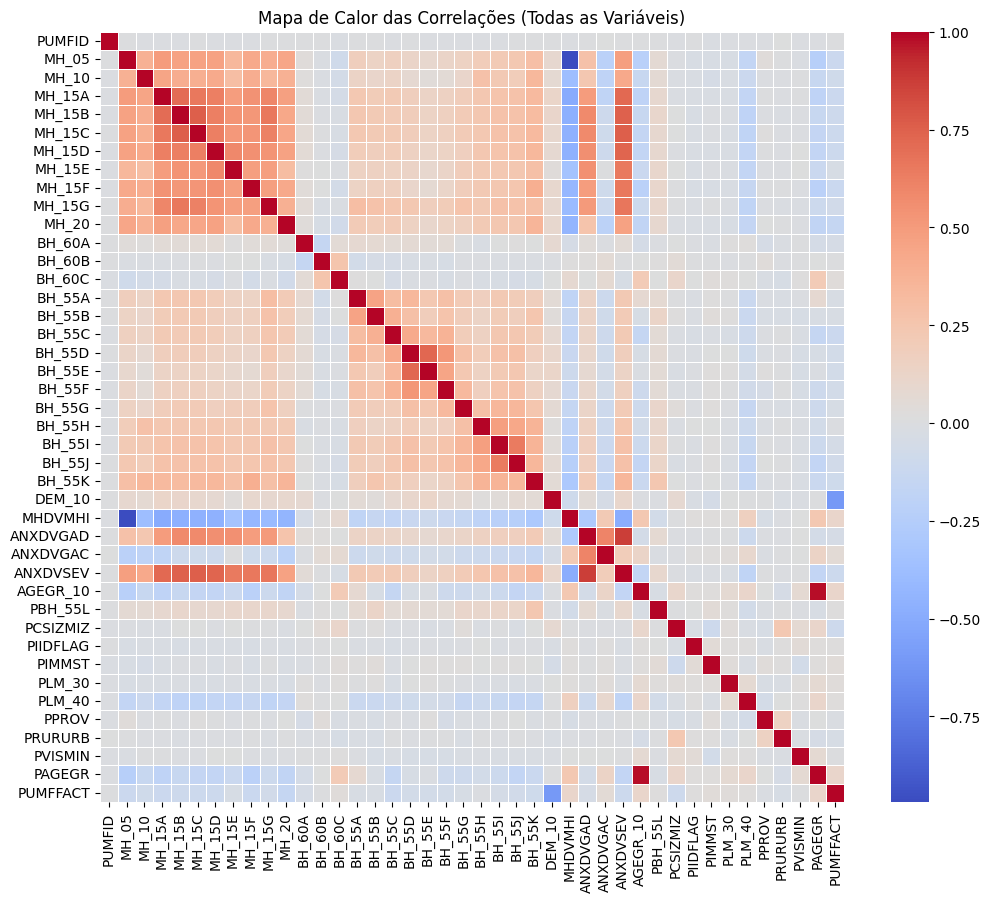

In [ ]:
# 1. Codificar variáveis categóricas em numéricas (usando One-Hot Encoding)
df_encoded = pd.get_dummies(df, drop_first=True)

# 2. Calcular a matriz de correlação para todas as variáveis
corr = df_encoded.corr()

# 3. Plotar o heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=False, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Mapa de Calor das Correlações (Todas as Variáveis)")
plt.show()


Observação: O relatório oferece uma visão detalhada da correlação entre cada variável, permitindo uma análise mais aprofundada. No entanto, caso prefira uma abordagem mais simples e direta, o gráfico abaixo apresenta a correlação de maneira visual e resumida, facilitando a interpretação dos relacionamentos entre as variáveis.

In [ ]:
# Seguindo nossa analise optamos por fazer a remoção desta variáveis abaixo.
df = df.drop(['PUMFID', 'VERDATE', 'MHDVMHI', 'PAGEGR', 'ANXDVGAD', 'ANXDVSEV','PUMFFACT'], axis=1)

KeyError: "['PUMFID', 'VERDATE', 'MHDVMHI', 'PAGEGR', 'ANXDVGAD', 'ANXDVSEV', 'PUMFFACT'] not found in axis"


Justificativa para remoção destes dados :

1. PUMFID: Trata-se de um identificador único, o que pode resultar em overfitting durante o treinamento do modelo, uma vez que ele não oferece informações úteis para a generalização.

2. VERDATE: Como se trata de uma variável relacionada a datas, ela pode introduzir overfitting no modelo, já que a relação temporal não é relevante para a análise preditiva e pode confundir o processo de treinamento.

3. 'MHDVMHI', 'PAGEGR': Essas variáveis apresentam uma alta correlação entre si, o que pode gerar multicolinearidade e resultar em ruído no modelo, prejudicando a capacidade de generalização e a interpretação dos resultados.

4.   'ANXDVGAD', 'ANXDVSEV' : Essas variáveis apresentam uma alta correlação com a variavél alvo o que pode gerar multicolinearidade e resultar em ruído no modelo, prejudicando a capacidade de generalização e a interpretação dos resultados.

5. 'PUMFFACT':





## 2. Pré-processamento e Tratamento dos Dados
Nesta etapa possui como objetivo realizar o processamento e tratamento dos dados para o nosso modelo de predição.

### 2.1 Tratamento de Dados Ausentes

In [ ]:
# Remover dados em que ANXDVGAC é igual a 9
df = df[df['ANXDVGAC'] != 9]

# Alterar todos os valores 9 ou 99 por NAN
df = df.replace({9: np.nan, 99: np.nan})

# Tratar valores ausentes (se necessário)
df = df.fillna(df.mode().iloc[0])


### 2.2 Codificação das Variáveis Categóricas
Não precisa de codificação.

Observação: Como nossa variável alvo contém alguns valores nulos, optamos por removê-los antes de tratar os demais valores ausentes, a fim de evitar possíveis problemas durante a análise.

In [ ]:

# Retornando as variáveis para os tipos originais
for col in df.columns:
  df[col] = pd.to_numeric(df[col], errors='coerce').fillna(0).astype(int)

## 3. Normalização e Escalonamento dos Dados

### 3.1 Escalonamento
Observação: Como nossos dados possuem uma estrutura sólida e são de grande escala, todos os dados sendo categóricos, optamos por não aplicar o escalonamento neste caso.

### 3.2 PCA
Escolhemos fazer o PCA para agrupar as perguntas sobre demográficos, mercado de trabalho e comportamento em apenas 2 variáveis.

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd

def apply_pca_and_combine(df, variables_to_combine3, variables_to_combine4, selected_vars, target_var):
    """
    Aplica PCA a dois grupos de variáveis e combina os resultados em um DataFrame com outras variáveis selecionadas.

    Parâmetros:
    - df: DataFrame original.
    - variables_to_combine3: Lista de variáveis do primeiro grupo para PCA.
    - variables_to_combine4: Lista de variáveis do segundo grupo para PCA.
    - selected_vars: Lista de variáveis adicionais para manter no DataFrame final.

    Retorna:
    - combined_df: DataFrame com os resultados dos PCAs e as variáveis selecionadas.
    """
    def perform_pca(df, variables, n_components=1):
        """
        Combina várias variáveis em uma única usando PCA.

        Parâmetros:
        - df: DataFrame contendo os dados.
        - variables: Lista de variáveis a serem combinadas.
        - n_components: Número de componentes principais desejados (default = 1).

        Retorno:
        - df_pca: DataFrame com a(s) nova(s) variável(is) PCA.
        """
        # Selecionar as variáveis desejadas
        X = df[variables]

        # Aplicar PCA
        pca = PCA(n_components=n_components)
        X_pca = pca.fit_transform(X)

        # Retornar o DataFrame resultante
        return X_pca, pca

    # Aplicar PCA no primeiro grupo de variáveis
    pca_result3, pca_model3 = perform_pca(df, variables_to_combine3)
    df_pca3 = pd.DataFrame(pca_result3, columns=["PCA_Group_3"])
    print("pca3", df_pca3.shape)

    # Aplicar PCA no segundo grupo de variáveis
    pca_result4, pca_model4 = perform_pca(df, variables_to_combine4)
    df_pca4 = pd.DataFrame(pca_result4, columns=["PCA_Group_4"])
    print("pca3", df_pca4.shape)

    # Selecionar as variáveis adicionais
    selected_df = df[selected_vars].reset_index(drop=True)
    print("selected", selected_df.shape)

    # Combinar os resultados dos PCAs com as variáveis selecionadas
    combined_df = pd.concat([df_pca3, df_pca4, selected_df.reset_index(drop=True),df[ target_var].reset_index(drop=True)], axis=1)

    # Retornar o DataFrame combinado
    return combined_df, pca_model3, pca_model4

# Listas de variáveis
variables_to_combine3 = ['DEM_10', 'AGEGR_10', 'PPROV', 'PRURURB', 'PIIDFLAG', 'PVISMIN', 'PIMMST', 'PCSIZMIZ', 'PLM_30', 'PLM_40']
variables_to_combine4 = ['BH_60A', 'BH_60B', 'BH_60C', 'BH_55A', 'BH_55B', 'BH_55C', 'BH_55D', 'BH_55E', 'BH_55F', 'BH_55G', 'BH_55H', 'BH_55I', 'BH_55J', 'BH_55K', 'PBH_55L']
selected_vars = ['MH_15C', 'MH_15D', 'MH_15F', 'MH_15G']
target_var = ['ANXDVGAC']

# Aplicar a função ao DataFrame
combined_df, pca_model3, pca_model4 = apply_pca_and_combine(df, variables_to_combine3, variables_to_combine4, selected_vars, target_var)

# Exibir o DataFrame resultante
combined_df.head()

# Variância explicada pelos PCAs
# print("\nVariância explicada pelo PCA (Group 3):", pca_model3.explained_variance_ratio_[0])
# print("Variância explicada pelo PCA (Group 4):", pca_model4.explained_variance_ratio_[0])

pca3 (45366, 1)
pca3 (45366, 1)
selected (45366, 4)


,PCA_Group_3,PCA_Group_4,MH_15C,MH_15D,MH_15F,MH_15G,ANXDVGAC
0,1.642105,2.381356,2,2,2,3,1
1,23.652220,-0.244392,2,2,2,1,2
2,24.653985,-0.648550,1,1,1,1,2
3,-11.359383,-1.276461,2,3,3,1,1
4,-22.341682,-1.992028,2,2,3,3,1


## 4. Divisão de Dados
Nesta etapa vamos separar nossa amostra em 70% Treino e 30% Teste para a futura aplicação no treinamento do nosso modelo.

### 4.1 Separação de Conjunto Treino e Teste


In [ ]:
# Separando os dados de treino e teste para o Pycaret
base_treino = combined_df.sample(frac=0.7, random_state=73)
base_teste = combined_df.drop(base_treino.index)

print('Base de treino',base_treino.shape)
print('Base de teste',base_teste.shape)


Base de treino (31756, 7)
Base de teste (13610, 7)


### 4.2 Validação Cruzada

A validação cruzada será implementada no próximo tópico.

## 5. Treinamento dos Modelos

Nesta etapa, utilizaremos a base de treino para implementar os testes de modelos que podem ser adequados para a nossa tarefa de predição. O objetivo é avaliar o desempenho de cada modelo e identificar qual deles apresenta os melhores resultados para o problema em questão.

## 5.1 Seleção e Treinamento de Modelos de Classificação e Otimização de Hiperparâmetros


In [ ]:
from pycaret.classification import *

# Configurar o ambiente com PyCaret
clf_setup = setup(
    data=base_treino,                # DataFrame com a base de treino
    target='ANXDVGAC',               # Variável alvo a ser predita
    fix_imbalance=True,              # Ativar balanceamento de classes (SMOTE por padrão)
    train_size=0.7,                  # Proporção de treino: 70% treino, 30% teste
    session_id=42,                   # Semente para garantir reprodutibilidade
    normalize=False,                 # Evitar normalização, pois a escala atual parece apropriada
    transformation=False,            # Não aplicar transformação nas variáveis (por enquanto)
    remove_outliers=False,           # Preservar outliers nesta configuração inicial
    use_gpu=False,                   # Não usar GPU (ajuste se estiver disponível)
    fold=10,                         # Número de folds para validação cruzada
    n_jobs=-1,                       # Usar todos os núcleos disponíveis para processamento
    log_experiment=False,            # Não registrar logs no MLFlow
    experiment_name='Classificação de Modelo COVID-19 Canada Health´s´ ',  # Nome da sessão de experimentação
    remove_multicollinearity=False,  # Não remover multicolinearidade para esta análise inicial
    feature_selection=False          # Não realizar seleção de features automaticamente
)


,Description,Value
0,Session id,42
1,Target,ANXDVGAC
2,Target type,Binary
3,Target mapping,"1: 0, 2: 1"
4,Original data shape,"(31756, 7)"
5,Transformed data shape,"(41015, 7)"
6,Transformed train set shape,"(31488, 7)"
7,Transformed test set shape,"(9527, 7)"
8,Numeric features,6
9,Preprocess,True


## 6. Escolha do Melhor Modelo e Métrica
Nesta etapa vamos em cima das metricas escolher qual será o melhor modelo para nossa predição.

### 6.1 Escolha da Métrica Adequada

In [ ]:
modelo = compare_models(fold=10)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ada,Ada Boost Classifier,0.9467,0.9896,0.9467,0.9480,0.9471,0.8730,0.8736,0.9100
svm,SVM - Linear Kernel,0.9466,0.9898,0.9466,0.9481,0.9471,0.8730,0.8738,0.3840
lda,Linear Discriminant Analysis,0.9462,0.9897,0.9462,0.9478,0.9466,0.8720,0.8729,0.1940
ridge,Ridge Classifier,0.9461,0.9897,0.9461,0.9478,0.9466,0.8719,0.8728,0.2640
lr,Logistic Regression,0.9450,0.9900,0.9450,0.9475,0.9456,0.8701,0.8715,0.7030
lightgbm,Light Gradient Boosting Machine,0.9449,0.9891,0.9449,0.9464,0.9454,0.8689,0.8697,1.2180
gbc,Gradient Boosting Classifier,0.9440,0.9897,0.9440,0.9464,0.9446,0.8675,0.8689,3.6350
xgboost,Extreme Gradient Boosting,0.9423,0.9879,0.9423,0.9438,0.9427,0.8625,0.8632,0.4020
rf,Random Forest Classifier,0.9413,0.9841,0.9413,0.9421,0.9416,0.8593,0.8596,2.8630
nb,Naive Bayes,0.9370,0.9888,0.9370,0.9424,0.9381,0.8534,0.8570,0.1550


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

A metríca que vamos utilizar para nossa análise é o AUC e F1 Score

Analisando todos os modelos acimas observamos que o Ada Boost Classifier foi o melhor modelo encima do classificador do Pycarret, porém o SVM - Linear Kernel e Ridge Classifier estão muito pouco abaixo.

Logo por questão de desempenho optamos por utilzar o Ridge Classifier para ser nosso modelo de predição.

Mas para comprovar esta minha observação vou explicitar abaixo ambos os modelos para esclarecer este ponto.

In [ ]:
#Criando Modelo
modelo = create_model('ada')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9492,0.9891,0.9492,0.9504,0.9495,0.8788,0.8793
1,0.9447,0.9897,0.9447,0.9460,0.9451,0.8681,0.8688
2,0.9496,0.9902,0.9496,0.9511,0.9500,0.8801,0.8808
3,0.9532,0.9915,0.9532,0.9546,0.9536,0.8887,0.8894
4,0.9474,0.9903,0.9474,0.9479,0.9476,0.8737,0.8738
5,0.9487,0.9895,0.9487,0.9503,0.9492,0.8782,0.8790
6,0.9456,0.9902,0.9456,0.9469,0.9460,0.8704,0.8710
7,0.9483,0.9886,0.9483,0.9489,0.9485,0.8760,0.8763
8,0.9456,0.9897,0.9456,0.9465,0.9459,0.8699,0.8703


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
#Criando Modelo
modelo = create_model('ridge')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9456,0.9891,0.9456,0.9467,0.9459,0.8701,0.8705
1,0.9487,0.9906,0.9487,0.9505,0.9492,0.8783,0.8792
2,0.9496,0.9900,0.9496,0.9509,0.9500,0.8799,0.8805
3,0.9523,0.9914,0.9523,0.9544,0.9528,0.8871,0.8884
4,0.9501,0.9905,0.9501,0.9507,0.9503,0.8804,0.8806
5,0.9469,0.9904,0.9469,0.9498,0.9476,0.8750,0.8768
6,0.9478,0.9905,0.9478,0.9494,0.9483,0.8760,0.8768
7,0.9433,0.9887,0.9433,0.9439,0.9435,0.8640,0.8642
8,0.9424,0.9890,0.9424,0.9437,0.9428,0.8627,0.8632


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

## 7. Avaliação de Importância das Variáveis

Neste tópico temos o objetivo  de vizualizar a importância das variavéis em nossa análise.

### 7.1 Identificação das Variáveis mais Relevantes

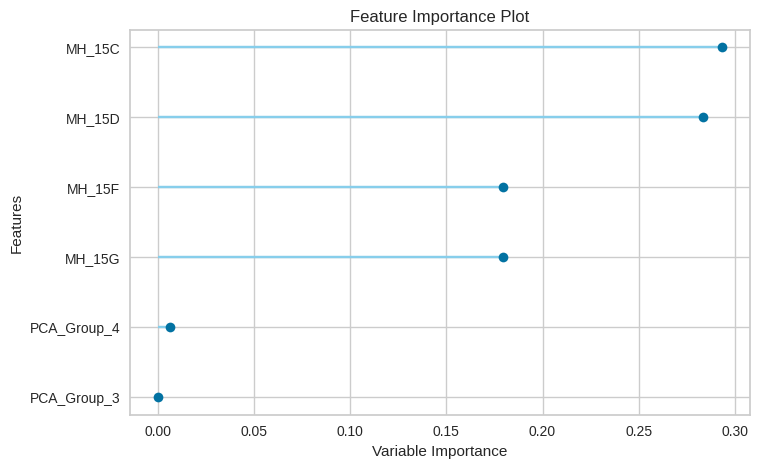

In [ ]:
plot_model(modelo, plot='feature')

## 8. Apresentação de Resultados
Por fim vamos apresentar a acertividade de nosso modelo emcima da nossa predição.

Lembrando que nossa variavel alvo é a ANXDVGAC

### 8.1 Métricas do Modelo Final

In [ ]:
# Vamos otimizar o nosso modelo
modelo_otimizado = tune_model(modelo)
modelo_otimizado

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9456,0.9891,0.9456,0.9467,0.9459,0.8701,0.8705
1,0.9487,0.9906,0.9487,0.9505,0.9492,0.8783,0.8792
2,0.9496,0.9900,0.9496,0.9509,0.9500,0.8799,0.8805
3,0.9528,0.9914,0.9528,0.9549,0.9533,0.8882,0.8895
4,0.9501,0.9905,0.9501,0.9507,0.9503,0.8804,0.8806
5,0.9469,0.9904,0.9469,0.9498,0.9476,0.8750,0.8768
6,0.9478,0.9905,0.9478,0.9494,0.9483,0.8760,0.8768
7,0.9433,0.9887,0.9433,0.9439,0.9435,0.8640,0.8642
8,0.9424,0.9890,0.9424,0.9437,0.9428,0.8627,0.8632


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


RidgeClassifier(alpha=8.63, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, positive=False, random_state=42, solver='auto',
                tol=0.0001)

Não e necessário neste nosso modelo a otimização dos dados,portanto não vamos utiliza-lo para nossa predição.

### 8.2 Visualização dos Resultados

In [ ]:
evaluate_model(modelo)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
# Testando com a 'base_teste' definida mais acima
predictions = predict_model(modelo_otimizado, data=base_teste)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ridge Classifier,0.9455,0.9433,0.9455,0.9472,0.9460,0.8699,0.8707


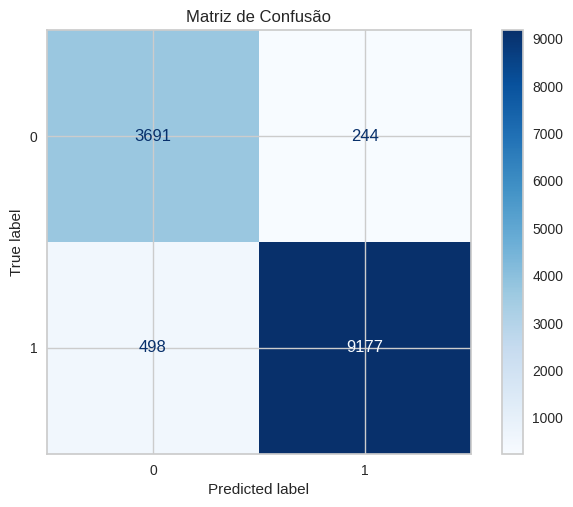

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns
import matplotlib.pyplot as plt

# Obtendo as previsões de classe
y_pred = predictions['prediction_label']
y_true = base_teste['ANXDVGAC']  # Substitua 'target_column' pelo nome da sua coluna alvo

# Calculando a matriz de confusão
cm = confusion_matrix(y_true, y_pred)

# Usando o ConfusionMatrixDisplay do sklearn
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title('Matriz de Confusão')
plt.show()



In [ ]:
# Remover a coluna alvo do conjunto transformado
X_test = base_teste.drop(columns=['ANXDVGAC'])

# Converter os valores da variável alvo de 1/2 para 0/1
base_teste['ANXDVGAC'] = base_teste['ANXDVGAC'].replace({1: 0, 2: 1})

# Calculando os escores da função de decisão usando o modelo otimizado
y_scores = modelo_otimizado.decision_function(X_test)
y_true = base_teste['ANXDVGAC']  # Substitua 'target_column' pelo nome da sua coluna alvo original


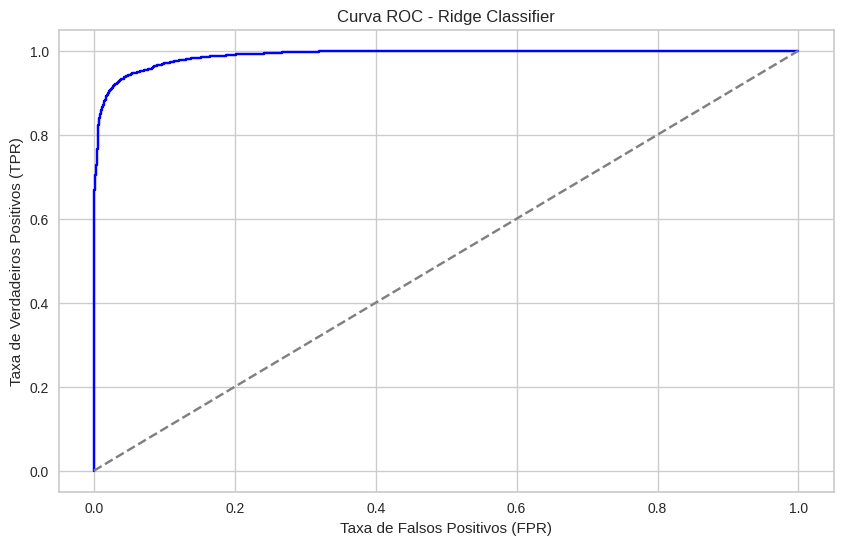

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Calculando a taxa de verdadeiros e falsos positivos
fpr, tpr, _ = roc_curve(y_true, y_scores)

# Calculando a AUC
auc_score = roc_auc_score(y_true, y_scores)

# Plotando a curva ROC
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'Curva ROC (AUC = {auc_score:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('Taxa de Falsos Positivos (FPR)')
plt.ylabel('Taxa de Verdadeiros Positivos (TPR)')
plt.title('Curva ROC - Ridge Classifier')
plt.show()
